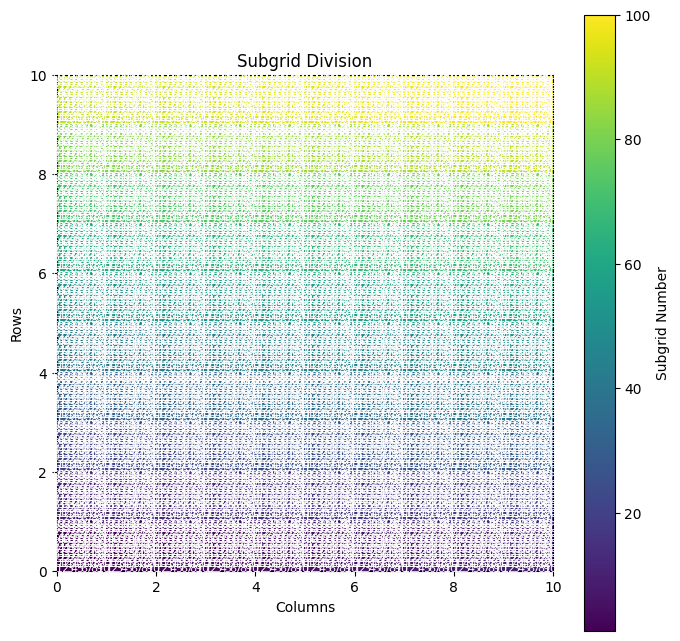

In [4]:
#Not the FINAL ONE
import numpy as np
import matplotlib.pyplot as plt


district = "Kavre"
total_rows = 10
total_cols = 10
subgrid_size = 0.1  # in km

# Create a 2D grid representing the main grid
grid = np.zeros((total_rows, total_cols), dtype=int)

# Populate the grid with subgrid numbers
subgrid_number = 1
for row in range(total_rows):
    for col in range(total_cols):
        grid[row, col] = subgrid_number
        subgrid_number += 1

# Visualize the grid
plt.figure(figsize=(8, 8))
plt.imshow(grid, cmap="viridis", origin="lower", extent=(0, total_cols, 0, total_rows))
plt.colorbar(label="Subgrid Number")
plt.title("Subgrid Division")
plt.xlabel("Columns")
plt.ylabel("Rows")

# Add house numbers to each subgrid
for row in range(total_rows):
    for col in range(total_cols):
        subgrid_id = grid[row, col]
        for sub_row in range(int(1 / subgrid_size)):
            for sub_col in range(int(1 / subgrid_size)):
                house_number = sub_row * int(1 / subgrid_size) + sub_col + 1
                plt.text(
                    col + (sub_col + 0.5) * subgrid_size,
                    row + (sub_row + 0.5) * subgrid_size,
                    str(house_number),
                    color="white",
                    ha="center",
                    va="center",
                    fontsize=8,
                )

plt.show()


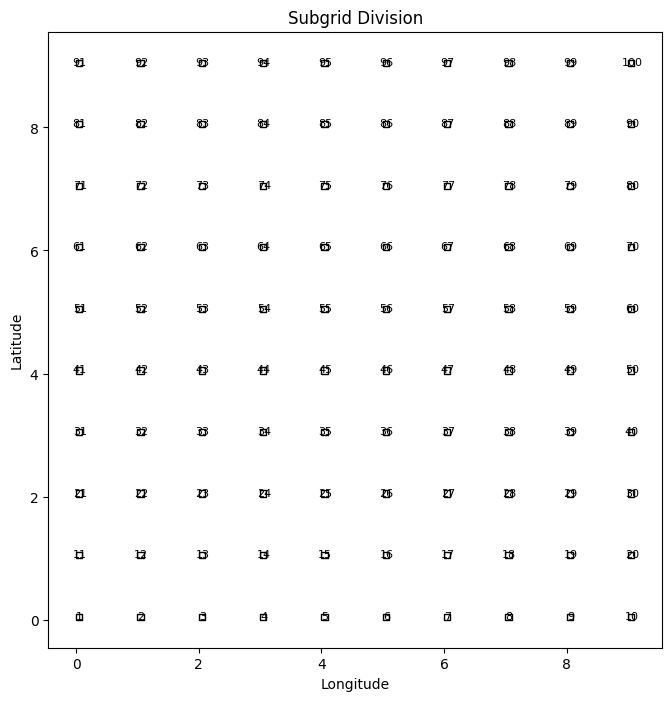

In [ ]:
#Not the FINAL ONE
!pip install mplcursors
import geopandas as gpd
import matplotlib.pyplot as plt
import mplcursors  # Import the mplcursors library
from shapely.geometry import Polygon

district = "Kavre"
total_rows = 10
total_cols = 10
subgrid_size = 0.1  # in km

# Create a GeoDataFrame with polygons representing subgrids
subgrids = []
for row in range(total_rows):
    for col in range(total_cols):
        subgrid_id = str(row * total_cols + col + 1)  # Calculate subgrid ID
        subgrid_polygon = Polygon(
            [
                (col, row),
                (col + subgrid_size, row),
                (col + subgrid_size, row + subgrid_size),
                (col, row + subgrid_size),
            ]
        )
        subgrids.append({"subgrid_id": subgrid_id, "geometry": subgrid_polygon})

gdf = gpd.GeoDataFrame(subgrids, crs="EPSG:4326")

# Visualize the subgrids
fig, ax = plt.subplots(figsize=(8, 8))
gdf.plot(edgecolor="black", facecolor="none", ax=ax)

# Add house numbers to each subgrid
for idx, row in gdf.iterrows():
    subgrid_id = row["subgrid_id"]
    centroid = row["geometry"].centroid
    text_offset = 0.01  # Offset value for placing text slightly to the side
    ax.text(
        centroid.x + text_offset,
        centroid.y + text_offset,
        subgrid_id,
        color="black",
        ha="center",
        va="center",
        fontsize=8,
    )

ax.set_title("Subgrid Division")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

# Define the cursor hover function
def cursor_hover(event):
    if event.artist:
        subgrid_id = event.artist.get_text()
        location = f"{district}-{subgrid_id} sub grid"
        print(f"Location: {location}")

# Connect the cursor hover function to the plot
mplcursors.cursor(hover=True).connect("add", cursor_hover)

plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import plotly.express as px
from shapely.geometry import Polygon

district = "Kavre"
total_rows = 10
total_cols = 10
subgrid_size = 0.1  # in km

# Create a GeoDataFrame with polygons representing subgrids
subgrids = []
for row in range(total_rows):
    for col in range(total_cols):
        subgrid_id = str(row * total_cols + col + 1)  # Calculate subgrid ID
        subgrid_polygon = Polygon(
            [
                (col, row),
                (col + subgrid_size, row),
                (col + subgrid_size, row + subgrid_size),
                (col, row + subgrid_size),
            ]
        )
        subgrids.append({"subgrid_id": subgrid_id, "geometry": subgrid_polygon})

gdf = gpd.GeoDataFrame(subgrids, crs="EPSG:4326")

# Create a Plotly figure
fig = px.choropleth_mapbox(
    gdf,
    geojson=gdf.geometry,
    locations=gdf.index,
    color="subgrid_id",
    opacity=0.5,
    hover_name="subgrid_id",
)

# Set mapbox style and center
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=8,
    mapbox_center={"lat": 27.65, "lon": 85.5},  # Centered in Kathmandu
)

# Display the figure
fig.show()


<ipython-input-9-76f06e6d3b2b>:6: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_cities' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



TypeError: ignored

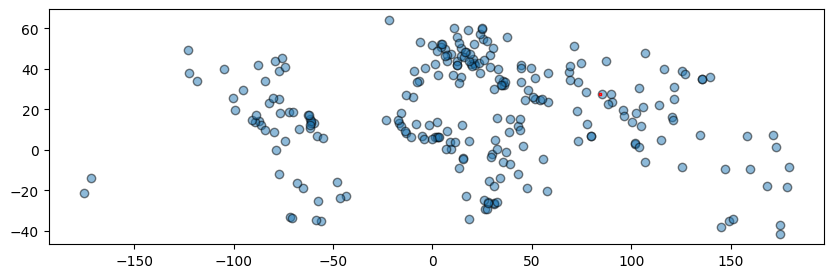

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# Load the Kathmandu-centered map using GeoPandas
kathmandu = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))
ax = kathmandu.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')

# Create the main grid and subgrids
main_grid_size = 1  # in km
subgrid_size = 0.1  # in km

# Plot the main grid
for lon in range(84, 86, main_grid_size):
    for lat in range(27, 29, main_grid_size):
        main_grid = plt.Rectangle((lon, lat), main_grid_size, main_grid_size, fill=False, edgecolor='r')
        ax.add_patch(main_grid)
        # Plot the subgrids within the main grid
        for sub_lon in range(lon, lon + main_grid_size, subgrid_size):
            for sub_lat in range(lat, lat + main_grid_size, subgrid_size):
                sub_grid = plt.Rectangle((sub_lon, sub_lat), subgrid_size, subgrid_size, fill=False, edgecolor='b')
                ax.add_patch(sub_grid)

# Set plot limits and title
ax.set_xlim(83.8, 86.2)
ax.set_ylim(26.8, 29.2)
ax.set_title("Main Grid and Subgrids Overlaid on Kathmandu Map")

# Add basemap using contextily
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.OpenStreetMap.Mapnik)

plt.show()


Saving buildings.geojson to buildings.geojson


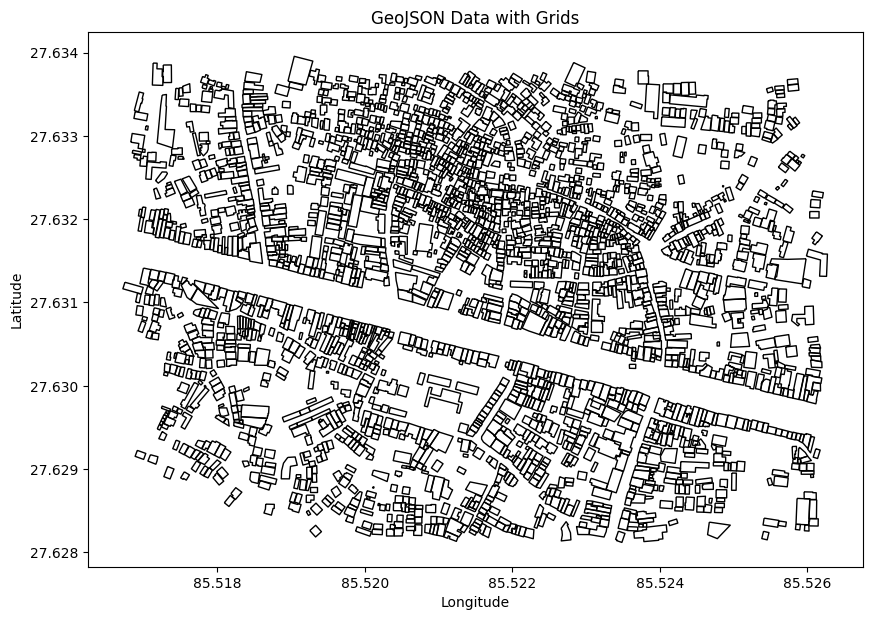

In [ ]:
#Data given to us
from google.colab import files
import geopandas as gpd
import matplotlib.pyplot as plt

# Upload the GeoJSON file
uploaded = files.upload()

# Get the uploaded filename
uploaded_filename = list(uploaded.keys())[0]

# Read the GeoJSON file using geopandas
buildings = gpd.read_file(uploaded_filename)

# Plot the GeoJSON data
ax = buildings.plot(edgecolor='black', facecolor='none', figsize=(10, 10))

# Add grid lines
main_grid_size = 1.0  # 1km x 1km
subgrid_size = 0.1   # 0.1km x 0.1km

for lon in range(int(buildings.bounds.minx.min()), int(buildings.bounds.maxx.max()), int(main_grid_size)):
    for lat in range(int(buildings.bounds.miny.min()), int(buildings.bounds.maxy.max()), int(main_grid_size)):
        main_grid = plt.Rectangle((lon, lat), main_grid_size, main_grid_size, fill=False, edgecolor='r')
        ax.add_patch(main_grid)
        for sub_lon in range(lon, lon + int(main_grid_size), int(subgrid_size)):
            for sub_lat in range(lat, lat + int(main_grid_size), int(subgrid_size)):
                sub_grid = plt.Rectangle((sub_lon, sub_lat), subgrid_size, subgrid_size, fill=False, edgecolor='b', linestyle='dotted')
                ax.add_patch(sub_grid)

ax.set_title("GeoJSON Data with Grids")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.show()


In [ ]:
#imported data to Maps
from google.colab import files
import geopandas as gpd
import folium
from folium import plugins

# Upload the GeoJSON file
uploaded = files.upload()

# Get the uploaded filename
uploaded_filename = list(uploaded.keys())[0]

# Read the GeoJSON file using geopandas
buildings = gpd.read_file(uploaded_filename)

# Calculate the bounds of the GeoJSON data
bounds = buildings.total_bounds

# Create a folium map centered around the GeoJSON data
m = folium.Map(location=[bounds[1], bounds[0]], zoom_start=15)

# Add the GeoJSON data to the map
folium.GeoJson(buildings).add_to(m)

# Create main grids (1km x 1km)
main_grid_size = 1.0  # 1km x 1km
for lon in range(int(bounds[0]), int(bounds[2]), int(main_grid_size * 1000)):
    for lat in range(int(bounds[1]), int(bounds[3]), int(main_grid_size * 1000)):
        folium.Rectangle(
            bounds=[(lat, lon), (lat + main_grid_size * 1000, lon + main_grid_size * 1000)],
            fill=False,
            color="red",
            weight=2,
        ).add_to(m)

# Create subgrids (0.1km x 0.1km)
subgrid_size = 0.1  # 0.1km x 0.1km
for lon in range(int(bounds[0]), int(bounds[2]), int(subgrid_size * 100)):
    for lat in range(int(bounds[1]), int(bounds[3]), int(subgrid_size * 100)):
        folium.Rectangle(
            bounds=[(lat, lon), (lat + subgrid_size * 100, lon + subgrid_size * 100)],
            fill=False,
            color="blue",
            weight=1,
            dash_array="4",
        ).add_to(m)

# Add the LayerControl to the map for toggling layers
folium.LayerControl().add_to(m)

# Display the map
m


Saving buildings.geojson to buildings (1).geojson


In [ ]:
import geopandas as gpd
import folium
from google.colab import drive

# Mount your Google Drive
drive.mount('/content/drive')

# Path to the GeoJSON file on your Google Drive
geojson_path = '/content/drive/MyDrive/buildings.geojson'

# Read the GeoJSON file using geopandas
buildings = gpd.read_file(geojson_path)

# Calculate the bounds of the GeoJSON data
bounds = buildings.total_bounds

# Create a folium map centered around the GeoJSON data
center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
m = folium.Map(location=center, zoom_start=15)

# Define the main grid size (1km x 1km)
main_grid_size = 0.01

# Calculate the latitude and longitude span
lat_span = bounds[3] - bounds[1]
lon_span = bounds[2] - bounds[0]

# Calculate the number of main grids in each direction
num_lat_grids = int(lat_span / main_grid_size)
num_lon_grids = int(lon_span / main_grid_size)

# Create main grid rectangles and add them to the map
for lat in range(num_lat_grids):
    for lon in range(num_lon_grids):
        main_grid = folium.Rectangle(
            bounds=[[bounds[1] + lat * main_grid_size, bounds[0] + lon * main_grid_size],
                    [bounds[1] + (lat + 1) * main_grid_size, bounds[0] + (lon + 1) * main_grid_size]],
            color='blue', fill_opacity=0, fill_color='blue', fill=True)
        main_grid.add_to(m)

# Add the GeoJSON data to the map
folium.GeoJson(buildings).add_to(m)

# Display the map
m


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Still not out main code, Numbered every buildings:
import geopandas as gpd
import folium
from folium.plugins import Fullscreen, MeasureControl
from shapely.geometry import Polygon

# Load the GeoJSON data using geopandas
geojson_path = "buildings.geojson"
gdf = gpd.read_file(geojson_path)

# Calculate the bounds of the GeoDataFrame
bounds = gdf.total_bounds

# Create a folium map centered around the bounds of the GeoDataFrame
center_location = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
m = folium.Map(location=center_location, zoom_start=15)

# Add fullscreen control to the map
fullscreen = Fullscreen()
fullscreen.add_to(m)

# Define the size of the main grid (1km x 1km)
main_grid_size = 0.01  # 1km in degrees (approximate)

# Calculate the latitude and longitude ranges based on the bounds of the GeoDataFrame
lat_range = (bounds[1], bounds[3])
lon_range = (bounds[0], bounds[2])

# Create the main grid lines and add them to the map
for lat in range(int(lat_range[0] * 100), int(lat_range[1] * 100), int(main_grid_size * 100)):
    main_grid_polygon = Polygon(
        [(lon_range[0], lat / 100),
         (lon_range[1], lat / 100),
         (lon_range[1], (lat + main_grid_size * 100) / 100),
         (lon_range[0], (lat + main_grid_size * 100) / 100),
         (lon_range[0], lat / 100)]
    )
    main_grid = folium.Polygon(
        locations=main_grid_polygon.exterior.coords,
        color='blue', fill_opacity=0, fill_color='blue'
    )
    main_grid.add_to(m)

for lon in range(int(lon_range[0] * 100), int(lon_range[1] * 100), int(main_grid_size * 100)):
    main_grid_polygon = Polygon(
        [(lon / 100, lat_range[0]),
         ((lon + main_grid_size * 100) / 100, lat_range[0]),
         ((lon + main_grid_size * 100) / 100, lat_range[1]),
         (lon / 100, lat_range[1]),
         (lon / 100, lat_range[0])]
    )
    main_grid = folium.Polygon(
        locations=main_grid_polygon.exterior.coords,
        color='blue', fill_opacity=0, fill_color='blue'
    )
    main_grid.add_to(m)

# Add numbering to buildings
for idx, row in gdf.iterrows():
    building_id = str(idx + 1)  # Start from 1
    centroid = row['geometry'].centroid
    folium.Marker(
        location=[centroid.y, centroid.x],
        icon=folium.DivIcon(html=f'<div style="color:blue;">{building_id}</div>')
    ).add_to(m)

# Add MeasureControl for grid distances
measure_control = MeasureControl(primary_length_unit='kilometers')
measure_control.add_to(m)

# Display the map
m


In [ ]:
#Took a direction from the center and used only those datas
import geopandas as gpd
import folium
from folium.plugins import Fullscreen, MeasureControl
from shapely.geometry import Polygon

# Load the GeoJSON data using geopandas
geojson_path = "buildings.geojson"
gdf = gpd.read_file(geojson_path)

# Calculate the bounds of the GeoDataFrame
bounds = gdf.total_bounds

# Create a folium map centered around the bounds of the GeoDataFrame
center_location = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
m = folium.Map(location=center_location, zoom_start=15)

# Add fullscreen control to the map
fullscreen = Fullscreen()
fullscreen.add_to(m)

# Define the size of the main grid (1km x 1km)
main_grid_size = 0.01  # 1km in degrees (approximate)

# Calculate the latitude and longitude ranges based on the bounds of the GeoDataFrame
lat_range = (bounds[1], bounds[3])
lon_range = (bounds[0], bounds[2])

# Create the main grid lines and add them to the map
for lat in range(int(lat_range[0] * 100), int(lat_range[1] * 100), int(main_grid_size * 100)):
    main_grid_polygon = Polygon(
        [(lon_range[0], lat / 100),
         (lon_range[1], lat / 100),
         (lon_range[1], (lat + main_grid_size * 100) / 100),
         (lon_range[0], (lat + main_grid_size * 100) / 100),
         (lon_range[0], lat / 100)]
    )
    main_grid = folium.Polygon(
        locations=main_grid_polygon.exterior.coords,
        color='blue', fill_opacity=0, fill_color='blue'
    )
    main_grid.add_to(m)

for lon in range(int(lon_range[0] * 100), int(lon_range[1] * 100), int(main_grid_size * 100)):
    main_grid_polygon = Polygon(
        [(lon / 100, lat_range[0]),
         ((lon + main_grid_size * 100) / 100, lat_range[0]),
         ((lon + main_grid_size * 100) / 100, lat_range[1]),
         (lon / 100, lat_range[1]),
         (lon / 100, lat_range[0])]
    )
    main_grid = folium.Polygon(
        locations=main_grid_polygon.exterior.coords,
        color='blue', fill_opacity=0, fill_color='blue'
    )
    main_grid.add_to(m)

# Sort the GeoDataFrame based on coordinates (left bottom first)
sorted_gdf = gdf.sort_values(by=['geometry'], ascending=[True])

# Add numbering to the first 100 buildings
for idx, row in sorted_gdf.head(100).iterrows():
    building_id = str(idx + 1)  # Start from 1
    centroid = row['geometry'].centroid
    folium.Marker(
        location=[centroid.y, centroid.x],
        icon=folium.DivIcon(html=f'<div style="color:blue;">{building_id}</div>')
    ).add_to(m)

# Add MeasureControl for grid distances
measure_control = MeasureControl(primary_length_unit='kilometers')
measure_control.add_to(m)

# Display the map
m


In [ ]:
import geopandas as gpd
import folium
from folium.plugins import Fullscreen, MeasureControl
from shapely.geometry import Polygon

# Load the GeoJSON data using geopandas
geojson_path = "buildings.geojson"
gdf = gpd.read_file(geojson_path)

# Calculate the bounds of the GeoDataFrame
bounds = gdf.total_bounds

# Create a folium map centered around the bounds of the GeoDataFrame
center_location = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
m = folium.Map(location=center_location, zoom_start=15)

# Add fullscreen control to the map
fullscreen = Fullscreen()
fullscreen.add_to(m)

# Define the size of the main grid (1km x 1km)
main_grid_size = 0.01  # 1km in degrees (approximate)

# Calculate the latitude and longitude ranges based on the bounds of the GeoDataFrame
lat_range = (bounds[1], bounds[3])
lon_range = (bounds[0], bounds[2])

# Create the main grid lines and add them to the map
for lat in range(int(lat_range[0] * 100), int(lat_range[1] * 100), int(main_grid_size * 100)):
    for lon in range(int(lon_range[0] * 100), int(lon_range[1] * 100), int(main_grid_size * 100)):
        main_grid_polygon = Polygon(
            [(lon / 100, lat / 100),
             ((lon + main_grid_size * 100) / 100, lat / 100),
             ((lon + main_grid_size * 100) / 100, (lat + main_grid_size * 100) / 100),
             (lon / 100, (lat + main_grid_size * 100) / 100),
             (lon / 100, lat / 100)]
        )
        main_grid = folium.Polygon(
            locations=main_grid_polygon.exterior.coords,
            color='blue', fill_opacity=0, fill_color='blue'
        )
        main_grid.add_to(m)

# Sort the GeoDataFrame based on coordinates (left bottom first)
sorted_gdf = gdf.sort_values(by=['geometry'], ascending=[True])

# Add sequential numbering (1 to 100) to the first 100 buildings, column-wise
for idx, row in sorted_gdf.head(100).iterrows():
    building_id = str(idx + 1)  # Start from 1
    centroid = row['geometry'].centroid
    folium.Marker(
        location=[centroid.y, centroid.x],
        icon=folium.DivIcon(html=f'<div style="color:blue;">{building_id}</div>')
    ).add_to(m)

# Add MeasureControl for grid distances
measure_control = MeasureControl(primary_length_unit='kilometers')
measure_control.add_to(m)

# Display the map
m


In [3]:
#this is our main code
import geopandas as gpd
import folium
from folium.plugins import Fullscreen, MeasureControl
from shapely.geometry import Polygon

# Load the GeoJSON data using geopandas
geojson_path = "buildings.geojson"
gdf = gpd.read_file(geojson_path)

# Calculate the bounds of the GeoDataFrame
bounds = gdf.total_bounds

# Create a folium map centered around the bounds of the GeoDataFrame
center_location = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
m = folium.Map(location=center_location, zoom_start=15)

# Add fullscreen control to the map
fullscreen = Fullscreen()
fullscreen.add_to(m)

# Define the size of the main grid (1km x 1km)
main_grid_size = 0.01  # 1km in degrees (approximate)

# Calculate the latitude and longitude ranges based on the bounds of the GeoDataFrame
lat_range = (bounds[1], bounds[3])
lon_range = (bounds[0], bounds[2])

# Create the main grid lines and add them to the map
for lat in range(int(lat_range[0] * 100), int(lat_range[1] * 100), int(main_grid_size * 100)):
    for lon in range(int(lon_range[0] * 100), int(lon_range[1] * 100), int(main_grid_size * 100)):
        main_grid_polygon = Polygon(
            [(lon / 100, lat / 100),
             ((lon + main_grid_size * 100) / 100, lat / 100),
             ((lon + main_grid_size * 100) / 100, (lat + main_grid_size * 100) / 100),
             (lon / 100, (lat + main_grid_size * 100) / 100),
             (lon / 100, lat / 100)]
        )
        main_grid = folium.Polygon(
            locations=main_grid_polygon.exterior.coords,
            color='blue', fill_opacity=0, fill_color='blue'
        )
        main_grid.add_to(m)

# Sort the GeoDataFrame based on coordinates (left bottom first)
sorted_gdf = gdf.sort_values(by=['geometry'], ascending=[True])

# Add sequential numbering (1 to 100) to the first 100 buildings, column-wise
for idx, row in sorted_gdf.head(100).iterrows():
    building_id = str(idx + 1)  # Start from 1
    centroid = row['geometry'].centroid
    marker = folium.Marker(
        location=[centroid.y, centroid.x],
        icon=folium.DivIcon(html=f'<div style="color:blue;">{building_id}</div>')
    )
    tooltip = f'Kavre-B-1-W-{building_id}-1'  # Tooltip text
    folium.Tooltip(tooltip).add_to(marker)
    marker.add_to(m)

# Add MeasureControl for grid distances
measure_control = MeasureControl(primary_length_unit='kilometers')
measure_control.add_to(m)

# Display the map
m


In [ ]:
import geopandas as gpd
import folium
import networkx as nx
from folium.plugins import Fullscreen, MeasureControl
from shapely.geometry import Polygon

# Load the GeoJSON data using geopandas
geojson_path = "buildings.geojson"
gdf = gpd.read_file(geojson_path)

# Calculate the bounds of the GeoDataFrame
bounds = gdf.total_bounds

# Create a folium map centered around the bounds of the GeoDataFrame
center_location = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
m = folium.Map(location=center_location, zoom_start=15)

# Add fullscreen control to the map
fullscreen = Fullscreen()
fullscreen.add_to(m)

# Define the size of the main grid (1km x 1km)
main_grid_size = 0.01  # 1km in degrees (approximate)

# Calculate the latitude and longitude ranges based on the bounds of the GeoDataFrame
lat_range = (bounds[1], bounds[3])
lon_range = (bounds[0], bounds[2])

# Create the main grid lines and add them to the map
for lat in range(int(lat_range[0] * 100), int(lat_range[1] * 100), int(main_grid_size * 100)):
    for lon in range(int(lon_range[0] * 100), int(lon_range[1] * 100), int(main_grid_size * 100)):
        main_grid_polygon = Polygon(
            [(lon / 100, lat / 100),
             ((lon + main_grid_size * 100) / 100, lat / 100),
             ((lon + main_grid_size * 100) / 100, (lat + main_grid_size * 100) / 100),
             (lon / 100, (lat + main_grid_size * 100) / 100),
             (lon / 100, lat / 100)]
        )
        main_grid = folium.Polygon(
            locations=main_grid_polygon.exterior.coords,
            color='blue', fill_opacity=0, fill_color='blue'
        )
        main_grid.add_to(m)

# Sort the GeoDataFrame based on coordinates (left bottom first)
sorted_gdf = gdf.sort_values(by=['geometry'], ascending=[True])

# Add sequential numbering (1 to 100) to the first 100 buildings, column-wise
for idx, row in sorted_gdf.head(100).iterrows():
    building_id = str(idx + 1)  # Start from 1
    centroid = row['geometry'].centroid
    marker = folium.Marker(
        location=[centroid.y, centroid.x],
        icon=folium.DivIcon(html=f'<div style="color:blue;">{building_id}</div>')
    )
    tooltip = f'Kavre-B-1-{building_id}-1'  # Tooltip text
    folium.Tooltip(tooltip).add_to(marker)
    marker.add_to(m)

# Create a graph from the GeoDataFrame using NetworkX
G = nx.Graph()
for idx, row in sorted_gdf.iterrows():
    G.add_node(idx, geometry=row['geometry'])

# Calculate the shortest path between each pair of buildings
for source in G.nodes():
    for target in G.nodes():
        if source != target:
            try:
                shortest_path = nx.shortest_path(G, source=source, target=target, weight='length')
                path_geometry = [G.nodes[node]['geometry'].coords[0] for node in shortest_path]
                folium.PolyLine(locations=path_geometry, color='red').add_to(m)
            except nx.NetworkXNoPath:
                pass

# Add MeasureControl for grid distances
measure_control = MeasureControl(primary_length_unit='kilometers')
measure_control.add_to(m)

# Display the map
m


In [ ]:
import geopandas as gpd
import folium
import networkx as nx
from folium.plugins import Fullscreen, MeasureControl
from shapely.geometry import Polygon

# Load the GeoJSON data using geopandas
geojson_path = "buildings.geojson"
gdf = gpd.read_file(geojson_path)

# Calculate the bounds of the GeoDataFrame
bounds = gdf.total_bounds

# Create a folium map centered around the bounds of the GeoDataFrame
center_location = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]
m = folium.Map(location=center_location, zoom_start=15)

# Add fullscreen control to the map
fullscreen = Fullscreen()
fullscreen.add_to(m)

# Define the size of the main grid (1km x 1km)
main_grid_size = 0.01  # 1km in degrees (approximate)

# Calculate the latitude and longitude ranges based on the bounds of the GeoDataFrame
lat_range = (bounds[1], bounds[3])
lon_range = (bounds[0], bounds[2])

# Create the main grid lines and add them to the map
for lat in range(int(lat_range[0] * 100), int(lat_range[1] * 100), int(main_grid_size * 100)):
    for lon in range(int(lon_range[0] * 100), int(lon_range[1] * 100), int(main_grid_size * 100)):
        main_grid_polygon = Polygon(
            [(lon / 100, lat / 100),
             ((lon + main_grid_size * 100) / 100, lat / 100),
             ((lon + main_grid_size * 100) / 100, (lat + main_grid_size * 100) / 100),
             (lon / 100, (lat + main_grid_size * 100) / 100),
             (lon / 100, lat / 100)]
        )
        main_grid = folium.Polygon(
            locations=main_grid_polygon.exterior.coords,
            color='blue', fill_opacity=0, fill_color='blue'
        )
        main_grid.add_to(m)

# Sort the GeoDataFrame based on coordinates (left bottom first)
sorted_gdf = gdf.sort_values(by=['geometry'], ascending=[True])

# Add sequential numbering (1 to 100) to the first 100 buildings, column-wise
for idx, row in sorted_gdf.head(100).iterrows():
    building_id = str(idx + 1)  # Start from 1
    centroid = row['geometry'].centroid
    marker = folium.Marker(
        location=[centroid.y, centroid.x],
        icon=folium.DivIcon(html=f'<div style="color:blue;">{building_id}</div>')
    )
    tooltip = f'Kavre-B-1-W-{building_id}-1'  # Tooltip text
    folium.Tooltip(tooltip).add_to(marker)
    marker.add_to(m)

# Create a graph from the GeoDataFrame using NetworkX
G = nx.Graph()
for idx, row in sorted_gdf.iterrows():
    G.add_node(idx, geometry=row['geometry'])

# Calculate the shortest path between each pair of buildings
for source in G.nodes():
    for target in G.nodes():
        if source != target:
            try:
                shortest_path = nx.shortest_path(G, source=source, target=target, weight='length')
                path_geometry = [G.nodes[node]['geometry'].coords[0] for node in shortest_path]
                folium.PolyLine(locations=path_geometry, color='red').add_to(m)
            except nx.NetworkXNoPath:
                pass

# Add MeasureControl for grid distances
measure_control = MeasureControl(primary_length_unit='kilometers')
measure_control.add_to(m)

# Display the map
m


In [ ]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import folium
import random
from itertools import combinations
import geopandas as gpd
from shapely.geometry import Point

# Load the street network data for Kathmandu
place_name = "Kathmandu, Nepal"
G = ox.graph_from_place(place_name, network_type="all")

# Load the GeoJSON file with building data
buildings_geojson = "buildings.geojson"
buildings = gpd.read_file(buildings_geojson)

# Define the number of buildings to select
num_buildings = 8

# Randomly select 8 building numbers
selected_building_numbers = random.sample(range(1, 101), num_buildings)

# Extract coordinates of the selected buildings
building_coordinates = buildings[buildings['building_number'].isin(selected_building_numbers)][['latitude', 'longitude']].values

# Calculate the shortest path between all possible pairs of selected buildings
building_combinations = list(combinations(selected_building_numbers, 2))
shortest_paths = []
for start_number, end_number in building_combinations:
    start = building_coordinates[selected_building_numbers.index(start_number)]
    end = building_coordinates[selected_building_numbers.index(end_number)]
    start_node = ox.distance.nearest_nodes(G, start[1], start[0])
    end_node = ox.distance.nearest_nodes(G, end[1], end[0])
    shortest_path = nx.shortest_path(G, source=start_node, target=end_node, weight="length")
    shortest_paths.append((start, end, shortest_path))

# Visualize the map with shortest paths
m = ox.plot_graph_folium(G, popup_attribute="name", edge_width=2)

# Add markers for the selected buildings
for i, (lat, lon) in enumerate(building_coordinates):
    folium.Marker([lat, lon], popup=f"Building {selected_building_numbers[i]}").add_to(m)

# Add shortest paths as colored polylines
for start, end, path in shortest_paths:
    folium.PolyLine([(G.nodes[node]["y"], G.nodes[node]["x"]) for node in path], color="blue").add_to(m)

# Display the map
m.save("shortest_paths_map.html")


In [ ]:

import folium
import geopandas as gpd

# Load the GeoJSON file into a GeoDataFrame
buildings_geojson = "buildings.geojson"
buildings_gdf = gpd.read_file(buildings_geojson)

# Create a folium map centered at a specific location
m = folium.Map(location=[27.700769, 85.300140], zoom_start=15)

# Add markers with tooltips for each building
for idx, row in buildings_gdf.iterrows():
    building_number = idx + 1  # Use row index as building number
    lat, lon = row.geometry.centroid.y, row.geometry.centroid.x
    folium.Marker([lat, lon], tooltip=f"Building {building_number}").add_to(m)

# Display the map
m


In [ ]:
#extra work to find the shortest distance between two building number using OSMNX library
import folium
import geopandas as gpd
import networkx as nx
import osmnx as ox

# Load the GeoJSON file into a GeoDataFrame
buildings_geojson = "buildings.geojson"
buildings_gdf = gpd.read_file(buildings_geojson)

# Ask the user for two building numbers
building1_number = int(input("Enter the first building number: "))
building2_number = int(input("Enter the second building number: "))

# Get the geometries of the selected buildings
building1_geometry = buildings_gdf.loc[building1_number - 1, 'geometry']
building2_geometry = buildings_gdf.loc[building2_number - 1, 'geometry']

# Calculate the center of the map
map_center = [(building1_geometry.centroid.y + building2_geometry.centroid.y) / 2,
              (building1_geometry.centroid.x + building2_geometry.centroid.x) / 2]

# Create a folium map centered at the calculated center
m = folium.Map(location=map_center, zoom_start=15)

# Add markers for the selected buildings
folium.Marker([building1_geometry.centroid.y, building1_geometry.centroid.x],
              tooltip=f"Building {building1_number}").add_to(m)
folium.Marker([building2_geometry.centroid.y, building2_geometry.centroid.x],
              tooltip=f"Building {building2_number}").add_to(m)

# Calculate the shortest path between the selected buildings using networkx
G = ox.graph_from_polygon(buildings_gdf.unary_union, network_type="all")
building1_node = ox.distance.nearest_nodes(G, building1_geometry.centroid.x, building1_geometry.centroid.y)
building2_node = ox.distance.nearest_nodes(G, building2_geometry.centroid.x, building2_geometry.centroid.y)
shortest_path = nx.shortest_path(G, source=building1_node, target=building2_node, weight="length")

# Plot the shortest path on the map
ox.plot_graph_route_folium(G, shortest_path, route_color='blue', route_opacity=0.7, folium_map=m)

# Display the map
m


Enter the first building number: 175
Enter the second building number: 196


In [ ]:
import folium
import geopandas as gpd
import networkx as nx
import osmnx as ox

# Load the GeoJSON file into a GeoDataFrame
buildings_geojson = "buildings.geojson"
buildings_gdf = gpd.read_file(buildings_geojson)

# Ask the user for two building numbers
building1_number = int(input("Enter the first building number: "))
building2_number = int(input("Enter the second building number: "))

# Get the geometries of the selected buildings
building1_geometry = buildings_gdf.loc[building1_number - 1, 'geometry']
building2_geometry = buildings_gdf.loc[building2_number - 1, 'geometry']

# Calculate the center of the map
map_center = [(building1_geometry.centroid.y + building2_geometry.centroid.y) / 2,
              (building1_geometry.centroid.x + building2_geometry.centroid.x) / 2]

# Create a folium map centered at the calculated center
m = folium.Map(location=map_center, zoom_start=15)

# Add markers for the selected buildings
folium.Marker([building1_geometry.centroid.y, building1_geometry.centroid.x],
              tooltip=f"Building {building1_number}").add_to(m)
folium.Marker([building2_geometry.centroid.y, building2_geometry.centroid.x],
              tooltip=f"Building {building2_number}").add_to(m)

# Create a network graph from OpenStreetMap within the place boundary
place_name = "Kathmandu, Nepal"
G = ox.graph_from_place(place_name, network_type="all")

# Calculate the nearest nodes in the graph for the selected buildings
building1_node = ox.distance.nearest_nodes(G, building1_geometry.centroid.x, building1_geometry.centroid.y)
building2_node = ox.distance.nearest_nodes(G, building2_geometry.centroid.x, building2_geometry.centroid.y)

# Calculate the shortest path between the selected buildings using networkx
try:
    shortest_path = nx.shortest_path(G, source=building1_node, target=building2_node, weight="length")
    # Plot the shortest path on the map using osmnx's plot_graph_folium function
    route_map = ox.plot_graph_folium(G, route=shortest_path, popup_attribute="length", color="blue")
    route_map.add_to(m)
except nx.NetworkXNoPath:
    print("No path found between the selected buildings.")

# Display the map
m

